<H1 style="text-align: center">ECMM447 - Social Networks and Text Analysis</H1>
<H2 style="text-align: center">Coursework Assessment</H2>

In [1]:
# Importing all essential libraries required throughout the work
import networkx as nx   #Library for network analysis
import matplotlib.pyplot as plt    # Library for plotting 
from pylab import rcParams   #Library for set the attributes of the figures
from collections import Counter   #Library for operating with dictionaries
import numpy as np   #Library for efficiently operating with arrays/matrices/vectors
import powerlaw   # Library to plot power law pdf and ccdf
from queue import Queue # Library to use queue data structure
from pylab import rcParams  #Library for set the attributes of the figures
import random # Library to generate random attributes
import copy # library to create copy objects to avoid refrencing issues
import community # Library for performing community detection
import scipy # Library to perform stats
from scipy import stats # Library to perform stats
import matplotlib.colors as mcolors # Library for setting colors of the plots
from matplotlib import pyplot, patches # Library for plot purposes

#Magic functions (%) for setting up the matplotlib and increase the resolution of the plots:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
rcParams['figure.figsize'] = 15, 8 # setting figure size
rcParams['figure.dpi'] = 150 # setting pixel density

<H2 style="text-align: center">Q1. Analyze a Network</H2>

### (1.a) Load the Network. 
### Please load the network form the edge-list file: ia-enron.edges as Gx. This is the edges of an undirected binary contact network.
### Note: The Enron communication network provided for this coursework is a modified version of the dataset of this paper:: Giang Hoang Nguyen et al. Continuous-Time Dynamic Network Embeddings. WWW ’18: Companion Proceedings of the The Web Conference 2018 DOI: 10.1145/3184558.3191526

In [2]:
file = open("ia-enron.edges.txt",'r') # Open the edges file
Gx = nx.read_edgelist(file, nodetype=int) # Creating Graph using edges file
file.close() # close the file IO

### (1.b) Plot the Network Adjacency Matrix.

Text(0.5, 1.0, 'Adjacency Matrix - ia-enron')

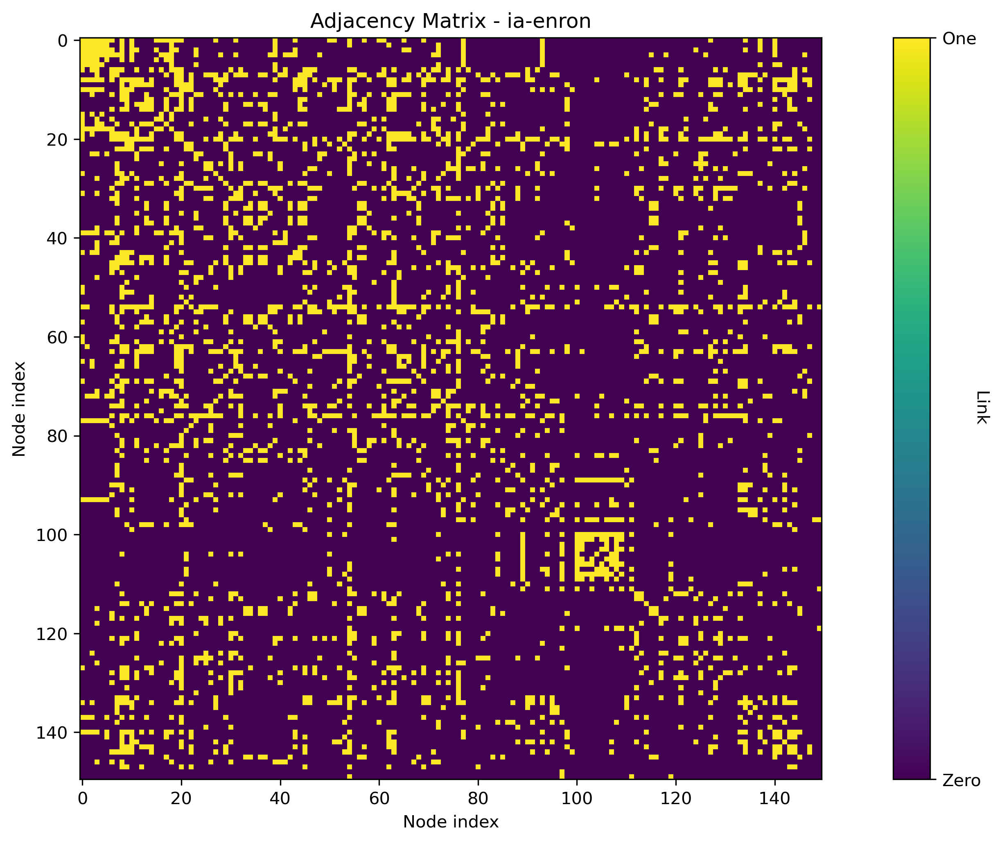

In [3]:
adj = nx.to_numpy_matrix(Gx) # creating adjacency matrix
plt.imshow(adj) # plotting adjacency matrix

# creating object for color bar and setting colorbar configuration
cbar = plt.colorbar() 
cbar.set_label('Link', rotation=270)
cbar.set_ticks([0,1])
cbar.ax.set_yticklabels(['Zero','One'],)

# setting plot titles and labels
plt.xlabel('Node index')
plt.ylabel('Node index')
plt.title("Adjacency Matrix - ia-enron")

### (1.c) Plot the Degree distribution.

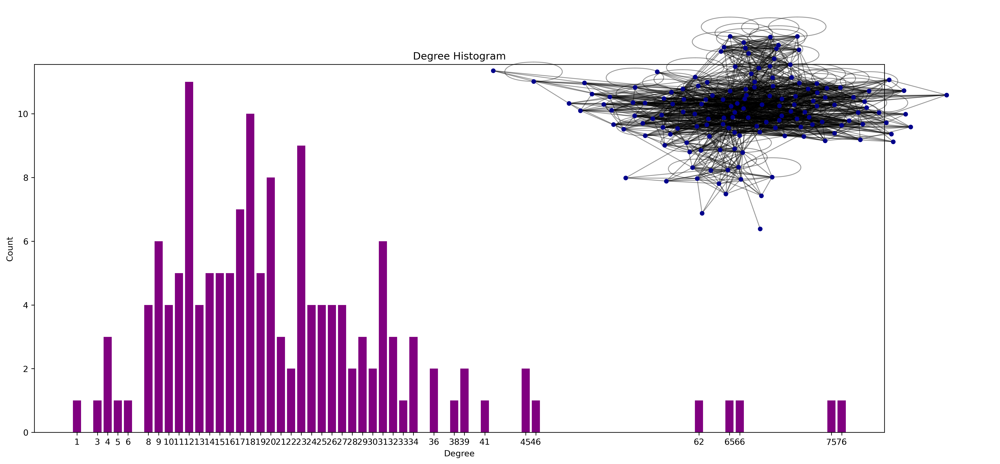

In [4]:
rcParams['figure.figsize'] = 18, 8
## ********* Correct Xticks *******
degree_sequence = sorted([d for n, d in Gx.degree()], reverse=True) # Getting degrees in descending order
degreeCount = Counter(degree_sequence)  # counting number of nodes with a degree
deg, cnt = zip(*degreeCount.items())
fig, ax = plt.subplots()
plt.bar(deg, cnt, width=0.80, color='purple')

#Set plot attributes as title, x and y labels, and ticks with frequencies larger than zero
plt.title("Degree Histogram")
plt.ylabel("Count")
plt.xlabel("Degree")
ax.set_xticks([d for d in deg])
ax.set_xticklabels(deg)

#Draw the network in inset
plt.axes([0.5, 0.5, 0.5, 0.5])

#Select the largest connected component of the network:
Gcc = Gx.subgraph(sorted(nx.connected_components(Gx), key=len, reverse=True)[0])

pos = nx.spring_layout(Gx) # Set the layout of the network
plt.axis('off') # Remove the axis of the network plot
nx.draw_networkx_nodes(Gx, pos, node_color= 'darkblue',node_size=20) # Plot the nodes
nx.draw_networkx_edges(Gx, pos, alpha=0.4) # Plot the edges

plt.show() 

### (1.d) Test the hypothesis that degree distribution has a lognormal shape. Using the Kolomoropv-Smirnov test can we accept or reject this hypothesis?

In [5]:
# Creating numpy array of degree distribution from 1.c
deg2 = np.array(cnt)

# Fitting the degree distribution into a lognormal distribution to get corresponding parameters
shape, location, scale = scipy.stats.lognorm.fit(list(deg2),floc=0)

#Putting params all together to perform ktest
ar = [shape, location, scale]
#print(ar)
# Performing KTest using parameters obtained by fitting obtained degree distribution in lognormal distribution
scipy.stats.kstest(list(cnt), 'lognorm',ar) 

KstestResult(statistic=0.20225935383776605, pvalue=0.05103025086386914)

P value obtained from KS Test is 0.0510 which is greater than 0.05 and is not statistically significant and indicates an evidence for null hypothesis. So we can accept the null hypothesis, that the degree distribution comes from a lognormal distribution.

Text(0.5, 1.0, 'Probability distribution of degree count log data ')

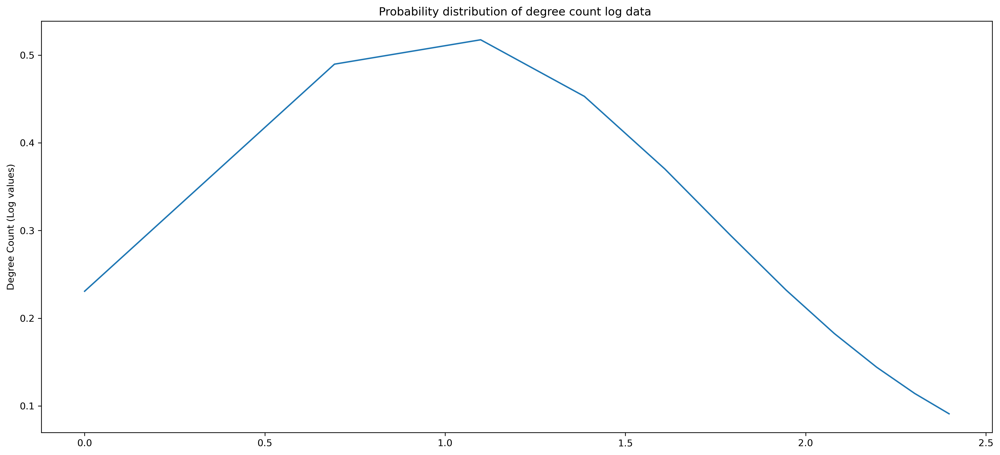

In [6]:
data = sorted(list(cnt)) # Sorting degree count
data_log = np.log(data) # taking log of count data
s = np.std(data_log) # calculating standard deviation
mu = np.mean(data_log) # calculating mean

fit = scipy.stats.norm.pdf(data_log,mu,s) # normal distribution of log data
plt.plot(data_log,fit) # plotting
plt.ylabel("Degree Count (Log values)")
plt.title("Probability distribution of degree count log data ")

We take the log of degree count and draw the probability distribution. It comes somewhere close to Gaussian, this shows that the degree distribution comes from a lognormal distribution

### (1.e) Is the Network you are analyzing Assortative or Disassortative? Please explain your answer.

In [7]:
# Computing Degree Correlation Coefficient
dgree_corr = nx.degree_assortativity_coefficient(Gx)
print("Degree Correlation Coefficient is: "+str(dgree_corr))

Degree Correlation Coefficient is: -0.04538787508087502


Text(0, 0.5, 'Average Degree of neighbors')

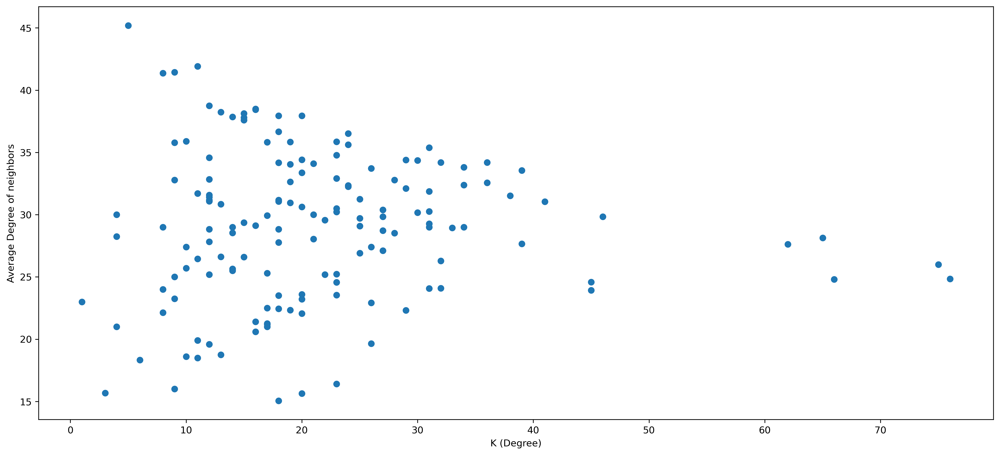

In [8]:
#### Plotting Degree Correlation #####

# Computing degree of every node in network
degr = dict(nx.degree(Gx))

# Sorting degree dictionary as per the key values or nodes
degr = dict(sorted(degr.items(), key=lambda x:x[0]))

# Computing Average Degree of neighbors of each node
avg_degrees = {}
all_nodes = list(Gx.nodes())
for n in all_nodes:
    nei = list(nx.neighbors(Gx,n))
    nei_deg = []
    for i in nei:
        nei_deg.append(degr[i])
    avg = np.mean(np.array(nei_deg))
    avg_degrees[n] = avg    # or use nx.average_neighbor_degree(Gx) to compute average degree of neighbors

# Sorting Average degree dictionary as per the key values or nodes
avg_degrees = dict(sorted(avg_degrees.items(), key=lambda x:x[0]))    

# Putting values in list which are to be plotted in on x and y axis
x = list(degr.values())
y = list(avg_degrees.values())

# Plotting Average degree of neighbors of a node vs. Degree of each node on a log log plot
plt.scatter(x,y)
plt.xlabel("K (Degree)")
plt.ylabel("Average Degree of neighbors")

Degree Correlation Coefficient is a way to quantify the Assortativity or Disassortativity of a network. From the experiment above, this coefficient comes out to be -0.04538 which is less than 0. The mathematical theory shows if degree correlation coefficient is less than 0, the network is disassortative.
From the plotted graph above, we can see how degree of each node correlates with average degree of neighbors of that node. We can see, that nodes with a lower degree connects more to the nodes with higher degree and nodes with higher degree connects more with nodes of lower degree.
Though, the correlation coefficient is negative, but it quite close to zero. This is the reason, the points are scattered somewhere, in a neutral way too. It is a little difficult to analyse the decreasing slope from the plot, but the degree correlation coefficient better shows the network is dissasortative.

### (1.f) Fitting.
### Plot the PDF and CCDF of the degree distribution as a power law, using the powerlaw package

Calculating best minimal value for power law fit
C:\ProgramData\Anaconda3\lib\site-packages\powerlaw.py:699: RuntimeWarning: invalid value encountered in true_divide
  (CDF_diff**2) /
C:\ProgramData\Anaconda3\lib\site-packages\powerlaw.py:699: RuntimeWarning: invalid value encountered in true_divide
  (CDF_diff**2) /


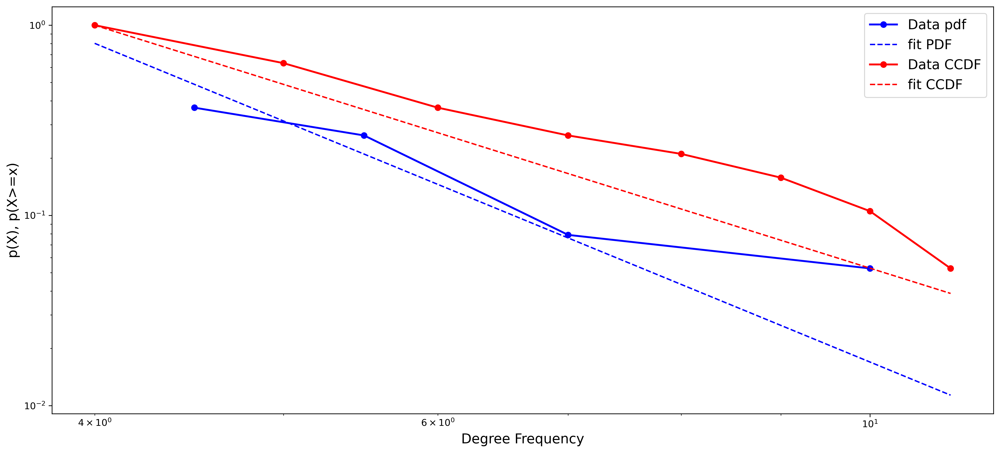

In [9]:
#rcParams['figure.figsize'] = 12,5

# sorting degrees in descending order
ordered_degreeCount = dict(sorted(degreeCount.items(), key=lambda item: item[1], reverse = True)) 

# Perform PowerLaw Fitting of degrees
fit = powerlaw.Fit(list(ordered_degreeCount.values()))

# plotting the ordered degree data
ax=fit.plot_pdf(color='b', linewidth=2, marker='o') 
fit.power_law.plot_pdf(color='b', linestyle='dashed', ax=ax)

# plotting ccdf 
fit.plot_ccdf(color='r', linewidth=2, ax=ax, marker='o')
fit.power_law.plot_ccdf(color='r', linestyle='dashed', ax=ax)

# setting plot configuration
plt.legend(['Data pdf', 'fit PDF', 'Data CCDF', 'fit CCDF'], fontsize = 'x-large')
plt.xlabel("Degree Frequency", fontsize = 'x-large')
plt.ylabel("p(X), p(X>=x)", fontsize = 'x-large')
plt.show()

<H2 style="text-align: center">Q2. Centrality and Community Detection</H2>

### (2.b.i) Closeness Centrality.
### Create the function centrality_closeness(), that inputs the network and returns the closeness centrality of each node. (Do not use the function closeness_centrality built in networkx or other python packages, you have to code it by yourself.)

In [10]:
# Breadth First Search Utility Function to find shortest distance between nodes of unweighted network, to be used in 
# closeness centrality function.

def BFS(network,source):
    '''
    Breadth First search is used here to find sum of shortest paths between each nodes.
    
    Parameters
    ----------------
    network: networkx.classes.graph.Graph
                networkx object of used network.
    source: int
            node id from where shortest distances to be claculated with all other nodes.
    Returns
    -----------------
    int
    Sum of the shortes distances
    
    '''
    graph = network.adj # defining graph in adjaceny list format
    visited = {}
    level = {} # distance dictionary
    parent = {}
    bfs_traversal = [] # order of traversal
    queue = Queue()  # object of queue datastructure
    nodes = list(network.nodes)

    
    for n in nodes:
        visited[n] = False # all nodes set to false, means none of them visited initially
        parent[n] = None # initialy parents of all is None
        level[n] = -1 # distance for all set to -1 initially
    
    # starting algo
    visited[source] = True # putting source node as visited from where we are starting
    level[source] = 0 # source node distance from itself is 0, so it is at level 0
    queue.put(source) # putting visited node in queue
    
    while not queue.empty():
        u = queue.get() # popping first element of queue
        bfs_traversal.append(u) # adding traversed node to traversal list
        
        # exploring adjacent vertex of u
        for v in graph[u]:
            if not visited[v]: # if adjacent vertex not visited earlier
                visited[v] = True # visit it and mark as True
                parent[v] = u # store parent of v
                level[v] = level[u] +1 # store level of v
                queue.put(v) # add v to queue
    
    # Shortest path from any node to source node (Commented as path is not needed) 
    # target can be used as an input in function if path needed. Removed for now
#     path = [] # to store path
#     v = target 
#     while v is not None: # looping untill parent is none
#         path.append(v) # traversing back from target
#         v = parent[v] # checking parent of current node
#     path.reverse() # reversing as we started from target node.
#     print(bfs_traversal)  # Path reachability to all nodes from source node 
#     print(len(bfs_traversal)) # checking length to verify all nodes were reached
    
    #return level[target]
    
    return sum(level.values())

def centrality_closeness(network):
    '''
    Computes Closeness centrality of a network.
    
    Parameters
    ----------------
    network: networkx.classes.graph.Graph
                networkx object of used network.
    Returns
    -----------------
    cent:  float
    Closeness Centrality
    '''
    
    cent = {}  # inititalize dictionary to store colseness centrality for each node
    nodes = list(network.nodes)
    n = len(nodes)
    
    # Iterating through all nodes and compute corresponding closeness centrality 
    for i in nodes:
        dist = BFS(network,source=i)
        ci = (n-1)/dist  # Closeness centraloity given by- (total nodes -1) / sum of all shortest distances from current node
        cent[i] = ci  # Store celoseness centrality of node
    
    return cent

### (2.b.ii) Comparison Centralities.
### Using the network Gx, compare the result of your metrics centrality_closeness() with the eigenvector centrality, with a scatter plot on the x closeness centrality measure and y the eigenvector centrality one. Is there any correlation? Why?

Text(0, 0.5, 'Eigen Vector Centrality')

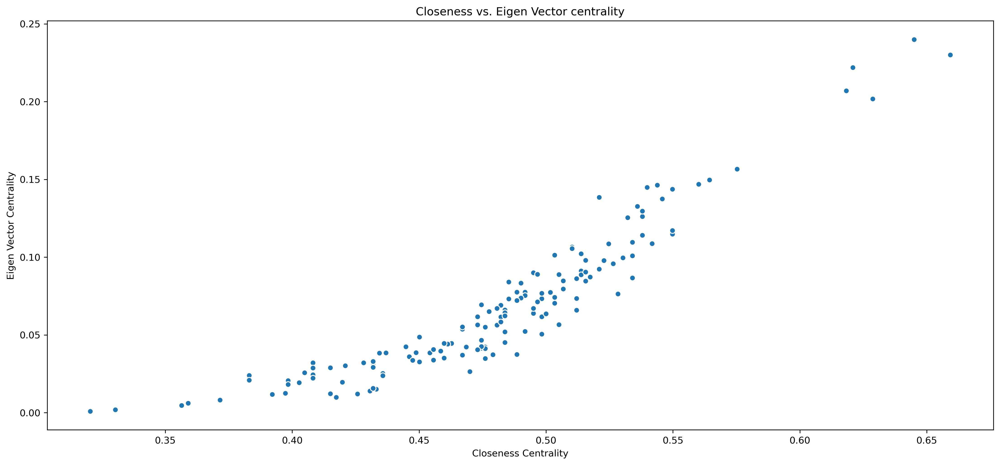

In [11]:
#rcParams['figure.figsize'] = 12,5

close = centrality_closeness(network= Gx).values() # Compute closeness centrality
eigen = nx.eigenvector_centrality(G=Gx).values() # Compute Eigen vector centrality

# Plotting scatter plot of both centralities
plt.scatter(close,eigen,edgecolors='w')
plt.title("Closeness vs. Eigen Vector centrality")
plt.xlabel("Closeness Centrality")
plt.ylabel("Eigen Vector Centrality")

The plot indicates, that there is a positive correlation between the Closeness and Eigen Vector Centrality. This indicates, that these measures are distinct, yet  conceptually related.More is the closeness centrality of a node, more is its eigen vector centrality. Or, more a node is closer to other nodes, more is its reachability to important nodes of the network.
As we know from discussion in 2a, Eigen Vector Centrality measures the node importance based on its connectivty with other important nodes. On the other hand, closeness centrality measures the importance of a node based on how close a node is to other nodes and can be used to decide a central point in a network, which is connected to other important nodes or points in a network. For, example closeness centrality can be used to determine a central distribution point in a delievery network. Means, that central point or node is conencted to other important nodes which can be delievery hubs or warehouses. 
This matches quite well with the idea of eigen vector centrality and could be seen as a reason of their high correlation.

### (2.c) Centrality Measure.
### Please consider now the network Gx loaded in question 1.a.. Imagine that Gx is now representing a social network, similar to Facebook, Instagram or WeChat. You have to advertise a product and you have budget to hire only one influencer (i.e. a node in the network Gx). Using the metrics within the centrality metrics we saw during the lectures ECMM447 and the Labs, suggest the influencer you will hire (as Node id). Explain your decision.

In [12]:
# Calculating Eigen Vector Centrality of network Gx
eigen_cent = nx.eigenvector_centrality(Gx)  

# Finding Node with Maximum Eigen Vector Centrality
influence_node = max(eigen_cent,key=eigen_cent.get)  

# Printing results
print("Node with maximum Eigenvector centrality is: Node "+str(influence_node)+
       " having Eigenvector centrality of "+ str(eigen_cent[influence_node]))

Node with maximum Eigenvector centrality is: Node 122 having Eigenvector centrality of 0.23999231568820278


Among different centrality metrices available, EigenVector Centrality can be effectively used to quantify the influence on the overall network. Eigenvector centrality measures a node’s importance while giving consideration to the importance of its neighbors. For example, a node with 500 relatively unpopular friends on Facebook would have lower eigenvector centrality than someone with 500 very popular friends (like Bill Gates). It is sometimes used to measure a node’s influence in the network. It does not only influence the nodes connected directly to it, but the overall network.
Following these characteristics of eigenvector Centrality metric we can select a node from network having high eigenvector centrality for the role of influencer, as that node will be reachable to maximum nodes or connections in the network via more important nodes which further have good links, thus increasing reachability of product to be advertised to a wider public.
Therefore, Node 122 would be a good choice of influencer having highest degree centrality of 0.239 amongst other nodes of the network.

### (2.d) Influencer.
### Define a function Draw_ego_network that inputs a network G (a networkx network), a network layout (as list of nodes position), and a node id and the maximum distance of interaction (as int). The function Draw_ego_network will output the network plot of G outlining (with a different color and bigger size) the node selected, and the ego network of the node id coloring in different colors the links and the nodes depending on the interaction distance. Test your function with the network Gx, the node id of the influencer selected in the question 2.c, a network layout of your choice (that will improve the readability of the plot) and interaction distance 2. (See the expected output at the end.)

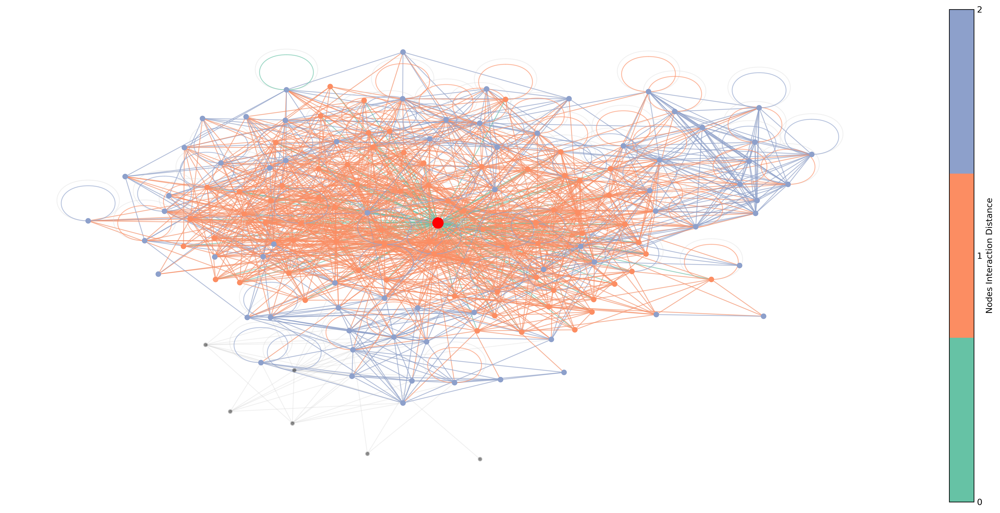

In [13]:
#Creating the Ego Network
def Draw_ego_network(G,layout,nodeid,max_dist):
    """
    Plots the ego network as an outline on input network upto maximum distance of interaction
    
    Parameters
    ----------------
    G: networkx.classes.graph.Graph
       networkx object of used network.
    
    layout: networkx object
       Layout position of the graph
            
    nodeid: int
       Ego Node
       
    max_dist:int
        Maximum distacne of interaction for ego network
    
    Returns
    -----------------
    None

    """
    
    #Creating Ego Network
    ego = nx.ego_graph(G, nodeid,radius=max_dist)
    
    # Fetching all pairs of nodes with distances
    path_lengths=dict(nx.all_pairs_dijkstra_path_length(ego,cutoff=3))
    
    # Creating clusters of paths at same distance from ego node 
    clusters = np.array(list(set(path_lengths[nodeid].values())))
    measures = path_lengths[nodeid]
    
    # Draw The graph
    nx.draw(G, pos=layout, node_size=10,with_labels=False,node_color='black',alpha=0.3,linewidths=2,
            edge_color='lightgray',cmap='coolwarm')

    #Creating dictionary of nodes with distances and edges from ego network
    node_length = path_lengths[nodeid]
    edges_length= {}

    for n in ego.edges():
        if node_length[n[0]]>node_length[n[1]]:
            edges_length[n] = node_length[n[1]]
        else:
            edges_length[n] = node_length[n[0]]
                    
    # Plotting the nodes in interaction wiht ego node
    nodes = nx.draw_networkx_nodes(G, layout, node_size=30, cmap=mcolors.ListedColormap(plt.cm.Set2(clusters)), 
                                    node_color=list(measures.values()),nodelist=list(measures.keys()),alpha=1)
    # Draw ego as large and red
    nx.draw_networkx_nodes(G, pos=layout, nodelist=[nodeid],node_size=150,node_color='r')
    
    # Draw edges
    nx.draw_networkx_edges(G, layout, edge_cmap=mcolors.ListedColormap(plt.cm.Set2(clusters)),alpha=0.6,
                          edge_color=list(edges_length.values()),edgelist=list(edges_length.keys()))

    # Adding and configuring colorbar
    cb = plt.colorbar(nodes,ticks=range(0,len(clusters)), label='Nodes Interaction Distance')
    cb.ax.tick_params(length=0)
    
    # Adding color labels to the colour bar
    cb.set_ticklabels(list(set(measures.values())))

    # Show the plot without the x/y axis
    plt.axis('off')
    plt.show()

# creating layout 
layout = nx.kamada_kawai_layout(Gx)

# Setting ego node
nodeid = influence_node

#Setting interaction distance
dist =2

# calling ego network function
Draw_ego_network(Gx,layout,nodeid,dist)

### (2.e) Community Detection and Centrality. 
### Decide and declare a community algorithm of your choice among the ones we saw during the lectures. Plot the network with its communities. Plot the adjacency matrix of the network rearranged in order to outline the communities.

In [14]:
def plot_comm(G, pos, measures, measure_name):
    '''
    Plots a network with detected communities for nodes passed in measures parameter.
    
    Parameters
    ----------------
    G: networkx.classes.graph.Graph
       networkx object of used network.
    pos: networkx layout of graph
    measures: dictionary containing the node and its corresponding community
    measure_name: The community detection algorithm used
    
    Returns
    -----------------
    None
    '''
  
    # Create an array to contain the clusters which have been found
    clusters=np.array(list(set(measures.values())))

    # Create a figure to draw the plots and charts
    plt.figure()

    # Create the plot of the network to be placed in the figure
    nodes = nx.draw_networkx_nodes(G, pos, node_size=250, cmap=mcolors.ListedColormap(plt.cm.Set3(clusters)), 
                                   node_color=list(measures.values()),
                                   nodelist=list(measures.keys()))


    # Add labels to the plot
    labels = nx.draw_networkx_labels(G, pos)

    # Add edges to the plot
    edges = nx.draw_networkx_edges(G, pos)

    # Add a colour bar to act as a legend
    cb = plt.colorbar(nodes,ticks=range(0,len(clusters)), label='Communities')
    cb.ax.tick_params(length=0)
    
    # Adds the community labels to the colour bar
    cb.set_ticklabels(list(set(measures.values())))

    nodes.set_clim(-0.5, len(clusters)-0.5)

    plt.title(measure_name)
    # Show the plot without the x/y axis
    plt.axis('off')
    plt.show()


In [15]:
def plot_comm_adj_mat(G, node_order=None, partitions=[], colors=[]):
    """
    Plots the adjacency matrix of a network rearranged in order of detected communities
    
    Parameters
    ----------------
    G: networkx.classes.graph.Graph
       networkx object of used network.
    
    node_order: list
       List of nodes ordered in the order of communities to which they belong.
            
    partitions: dict
       dictionary containing the node and its corresponding community
       
    colors:string
        Color to outline community patch in adjacency matrix 
    
    Returns
    -----------------
    None
    
    """
    
    # Creating the adjacency matrix
    adjacency_matrix = nx.to_numpy_matrix(G, nodelist=node_order) 

    #Plot adjacency matrix and set colorbar configuration
    fig = plt.figure(figsize=(10, 8))
    plt.imshow(adjacency_matrix,cmap="Blues",interpolation="none")
    plt.xlabel("Node ID")
    plt.ylabel("Node ID")
    plt.title("Adjacency Matrix of detected Communities")
    cbar = plt.colorbar(boundaries = [0,0.5,1]) 
    cbar.set_label('Link', rotation=270)
    cbar.set_ticks([0,1])
    cbar.ax.set_yticklabels(['Zero','One'],)
    
    # Highlighting the sorted nodes in community in boundaries
    #assert len(partitions) == len(colors)
    ax = plt.gca()
    for partition, color in zip(partitions, colors):
        current_idx = 0
        for module in partition:
            ax.add_patch(patches.Rectangle((current_idx, current_idx),
                                          len(module), # Width
                                          len(module), # Height
                                          facecolor="none",
                                          edgecolor=color,
                                          linewidth="1"))
            current_idx += len(module)

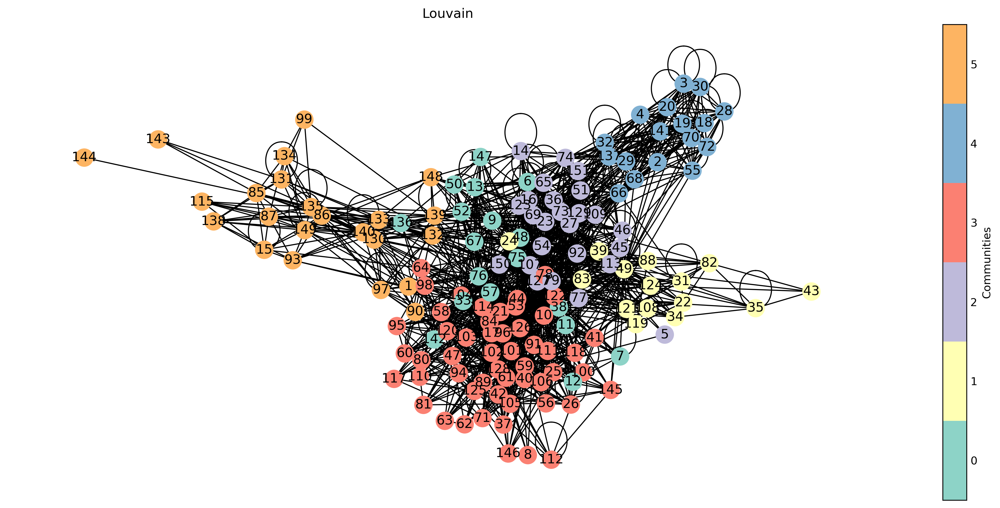

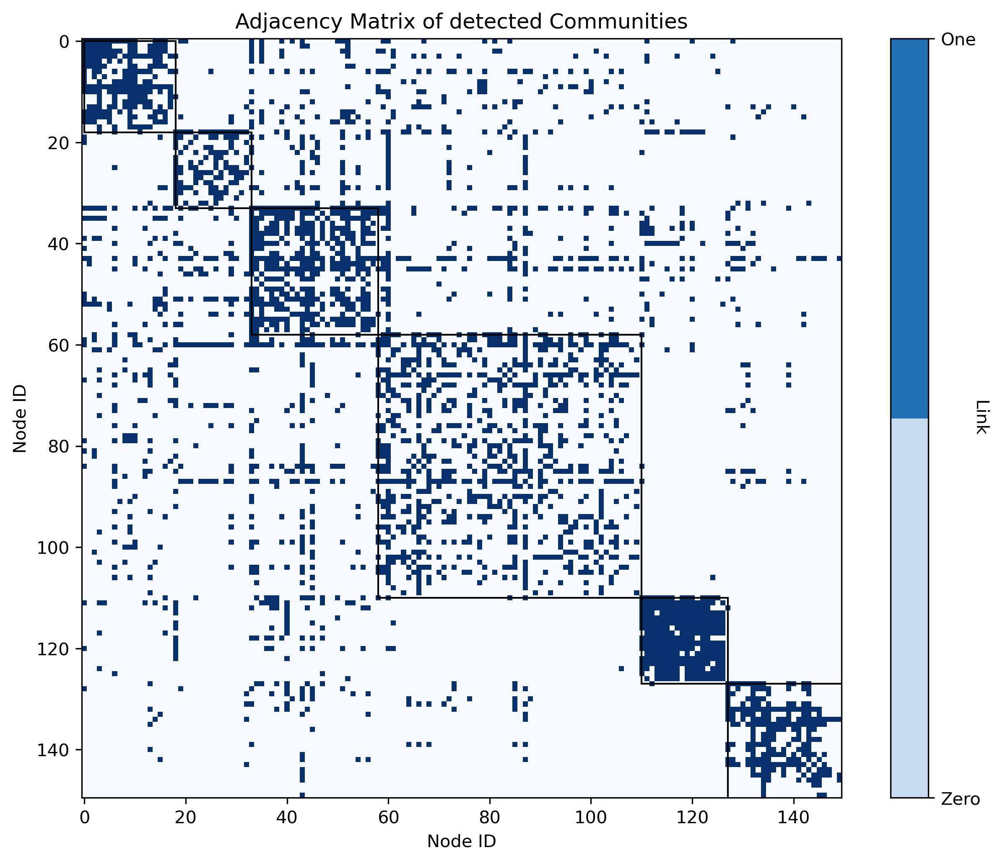

In [16]:
#*********************Run louvain community finding algorithm*************************

#Creating Community Partition
louvain_community_dict = community.best_partition(Gx)

# Setting a layout
pos = nx.spring_layout(Gx)

#Plotting the communities using Louvain algorithm
plot_comm(Gx, pos, louvain_community_dict,'Louvain' )

# Fetching community labels 
communities = np.unique(list(louvain_community_dict.values()))

group = {} # initialising a dictionary to hold the community and respective nodes as list values
for i in communities:
  group.setdefault(i,[])

#Assigning community labels to respective node lists
for node_id, comm in louvain_community_dict.items():
   group[comm].append(node_id)
 
louvain_comms = group.values()
#Ordering the Nodes in order of the communities they belong to in a single list
nodes_louvain_ordered = [node for comm in louvain_comms for node in comm]

#Plotting the adjacency matrix in order ofarranged communities
plot_comm_adj_mat(Gx, nodes_louvain_ordered, [louvain_comms], ["black"])

### (2.f) Find and plot the longest Shortest Path.
### Create a function plot_long_shortest() that takes as input Gx. The function plot_long_shortest() returns the plot of Gx with outlined the longest shortest path present inside the network, print the length of path as list of number of nodes included in the shortest path). Find the longest shortest paths inside the network Gx, using your function plot_long_shortest() print the source node the target node and the ids of the nodes within the longest shortest path.

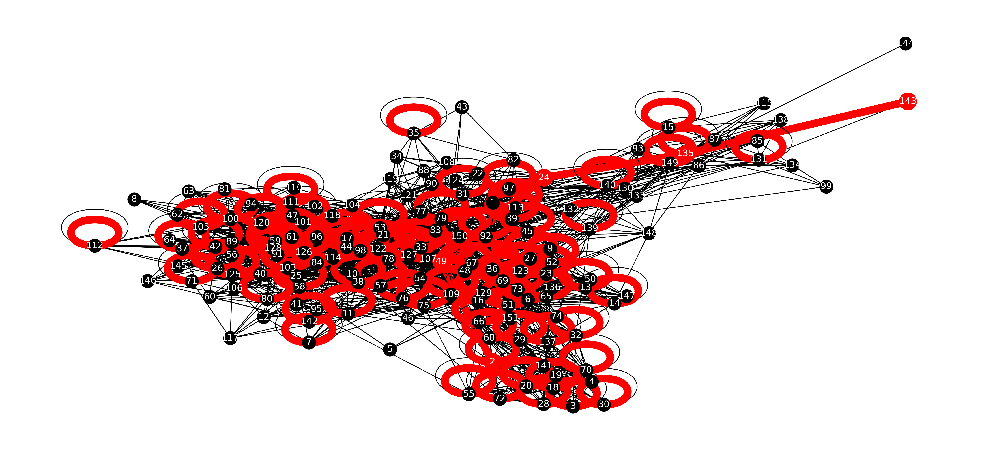

Longest Shortest path in the network is [2, 49, 24, 135, 143] with path length: 5 


In [17]:
def plot_long_shortest(G):
    '''
    Find longest shortest path in the given network and plots the path on network.
    
    Parameters
    ----------------
    G: networkx.classes.graph.Graph
       networkx object of used network.
    '''
    # Fetching nodes of network and sorting them
    nodes = sorted(G.nodes()) 
    
    # Initialising Longest SHortest Distance as 0
    longest_shortest_dist = 0
   
    # Finding the longest Shortest Path by comparing shortest paths between each nodes of network
    for ni in nodes:
        for nj in nodes:
            if(ni != nj):
                shortest_dist = nx.shortest_path_length(G, ni, nj)
                if(shortest_dist > longest_shortest_dist):
                    longest_shortest_dist = shortest_dist
                    longest_shortest_path = nx.shortest_path(G, ni, nj)
    
    # Plot the original network
    pos = nx.spring_layout(G)
    nx.draw(G,pos,node_color='k', with_labels=True, font_color='white')
    
    # Create a list of iterables with the edges of the shortest path
    path_edges = list(zip(longest_shortest_path,longest_shortest_path[1:]))
    
    # Plot the nodes of longest shortest path nodes in red color
    nx.draw_networkx_nodes(G,pos,nodelist=longest_shortest_path,node_color='r', label=True, node_size=500 )
    
    # Plot the edges of longest shortest path in red color
    nx.draw_networkx_edges(G,pos,edgelist=path_edges,edge_color='r',width=10) 
    plt.show()
    
    print("Longest Shortest path in the network is {0} with path length: {1} ".format(longest_shortest_path,len(longest_shortest_path)))


plot_long_shortest(Gx)

<H2 style="text-align: center">Q3. SI Model</H2>

In this section you have to create your functions and you cannot use any pre-written code or python libraries
that perform SI/SIR/SIS simulation. If you will use python libraries that implement SI/SIR models or similar
you will get zero points.
(Note: sampling matters. To run 100 simulations a pc should not take more than 3 minutes. Please select a
correct amount of simulations to validate your analysis.)

### (3.a) SI Model.
### Define the function SI_model() that inputs:
### • G (Network as networkx)
### • initial_infecteds (as list of nodes ID)
### • beta (trasmission probability as float)
### • t_simulation (simulation iteration time as int - one day is one time iteration)
### Output: A dictionary that contains the nodes status at each time steps. In this case the status can be:
### • ’S’ as susceptible.
### • ’I’ as Infected

### Using the network Gx and beta=0.01, t_simulation=300, initial_infecteds=(list of 3 random nodes). plot the number of user in each status at each time step of the simulation.

In [18]:
def SI_model(G,initial_infecteds,beta,t_simulation):
    
    '''
    Performs a simulation of SI model and returns the status of each node of a network at end of simulation.At end of simulation
    nodes are in Susceptible or Infected states
    
    Parameters
    ----------------
    G: networkx.classes.graph.Graph
       networkx object of used network.
    
    initial_infecteds: list
       Nodes with initial infection at time 0
            
    beta: float
       Infection rate
       
    t_simulation:int
        Number of days/time 
    
    Returns
    -----------------
    status:  python dictionary
    Status of each node at end of simulation
    
    '''
                    
    nodes = G.nodes() # Fetching nodes of the network

    N = len(nodes) # Number of nodes in the network
    
    infected = initial_infecteds # infected nodes 
    suscep = [n for n in nodes if n not in infected] # Nodes in the susceptible state after introdcution of infection
    
    status = {} # Initialising dictionary to store status of each node at end of simulation
    
    # deepcopy used to create a new object of list as python uses list by refrence and not values
    inf_add = copy.deepcopy(infected) # Creating deepcopy object of infected nodes to store in status dictionary
    sus_add = copy.deepcopy(suscep)  # Creating deepcopy object of susceptible nodes to store in status dictionary
    
    status[0] = {"S":sus_add,"I":inf_add} # Storing status for day 0 when infection is introduced
    
    # Starting simulation from day 1
    for t in range(1,t_simulation+1):
        got_infected = [] # Nodes getting infected on a day of simulation
        
        for node in infected: # Iterating over infected nodes
            for neighbor in G.neighbors(node): # checking neighbors of infected nodes
                p = random.random()  # generating a random probability of node mixing
                if  p <= beta: # checking probability with infection rate
                    if neighbor not in infected and neighbor not in got_infected:
                        got_infected.append(neighbor)  # If prbabiloty under transimission rate, then node gets infected
        
        infected.extend(got_infected) # Extending infected nodes on a day to the overall infected list
        suscep = [n for n in nodes if n not in infected] # Computing the suscptible population at end of the day
        
        inf_add = copy.deepcopy(infected) # Creating deepcopy object of infected nodes to store in status dictionary
        sus_add = copy.deepcopy(suscep) # Creating deepcopy object of susceptible nodes to store in status dictionary
        
        status[t] = {"S":sus_add,"I":inf_add} # Adding node status at end of the day
    
    return status

Wall time: 1min 12s


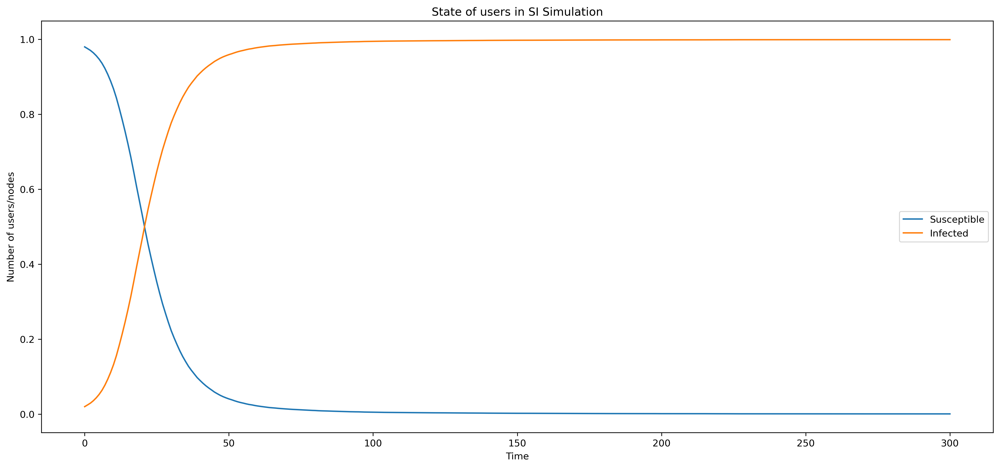

In [19]:
%%time

# Running SI model with different number of samples.
samples = 300
final_S = [] # list to store the susceptible nodes under different samples.
final_I = [] # list to store the infected nodes under different samples.

# Running simulation for different number of samples.
for s in range(samples):
    ini = random.sample(list(Gx.nodes()),3) # Setting 3 random initial nodes as infected
    mo = SI_model(G=Gx,initial_infecteds=ini,beta=0.01,t_simulation=300) # calling SI model function
    
    x = list(mo.keys())
    N = len(Gx.nodes())
                    
    s_num = [len(mo[i]["S"])/N for i in x] # extracting number of susceptible nodes on each day
    i_num = [len(mo[i]["I"])/N for i in x] # extracting number infected nodes on each day
    
    # Adding to final lists
    final_S.append(s_num) 
    final_I.append(i_num)
    
# Calculating mean of samples
mean_S_SI = np.mean(np.array(final_S),axis=0)
mean_I_SI = np.mean(np.array(final_I),axis=0)

# Plotting the outputs from SI model
plt.plot(x, mean_S_SI, label="Susceptible")
plt.plot(x, mean_I_SI, label="Infected")  
plt.title("State of users in SI Simulation")
plt.xlabel("Time")
plt.ylabel("Number of users/nodes")
plt.legend()

### (3.b) SIR Model
### It has been discovered that infected nodes become immune after a given recovery time. If a node is immune
### and it is in contact with the infected node it does not became infected, and it will not spread the infection!
### Define the function SIR_model() that inputs:
### • G (a Network as networkx)
### • initial_infected (nodes that are infected at time=0 as list of nodes ID)
### • beta (trasmission probability as float)
### • t_simulation (simulation iteration time as int)
### • recovery_time (the number of days needed for the recovery.)
### Output: a dictionary that contains the nodes status at each time steps. In this case the status can be:
### • ’S’ as susceptible.
### • ’I’ as Infected.
### • ’R’ as Recovered.

### Using the network Gx and beta=0.005, t_simulation=300, initial_infected=(list of 3 random nodes), recovery_time=15, plot the number of users in each status at each simulation time step

In [20]:
def SIR_model(G,initial_infecteds,beta,t_simulation,recovery_time):
    '''
    Performs a simulation of SIR model and returns the status of each node of a network at end of simulation. At end of 
    simulation nodes are in Susceptible, Infected and Recovered states
    
    Parameters
    ----------------
    G: networkx.classes.graph.Graph
       networkx object of used network.
    
    initial_infecteds: list
       Nodes with initial infection at time 0
       
            
    beta: float
       Infection rate
       
    t_simulation:int
        Number of days/time 
    
    recovery_time:int
        Number of days/time taken by a node to recover
    
    Returns
    -----------------
    status:  python dictionary
    Status of each node at end of simulation
    
    '''
                    
    nodes = G.nodes() # Fetching nodes of the network
    N = len(nodes) # Number of nodes in the network
    
    gamma = 1/recovery_time # calculating recovery rate
    
    infected = initial_infecteds # infected nodes 
    suscep = [n for n in nodes if n not in infected] # Nodes in the susceptible state after introduction of infection
    recovered = [] # No node is recovered intially
    
    status = {} # Initialising dictionary to store status of each node at end of simulation
    
    inf_add = copy.deepcopy(infected) # Creating deepcopy object of infected nodes to store in status dictionary
    sus_add = copy.deepcopy(suscep) # Creating deepcopy object of susceptible nodes to store in status dictionary
    rec_add = copy.deepcopy(recovered) # Creating deepcopy object of recovered nodes to store in status dictionary
    
    status[0] = {"S":sus_add,"I":inf_add, "R":rec_add} # Storing status for day 0 when infection is introduced
    
    # Starting simulation from day 1
    for t in range(1,t_simulation+1):
        got_infected = [] # Nodes getting infected on a day of simulation
        got_recovered = [] # Nodes getting recovered on a day of simulation
        
        for node in infected: # Iterating over infected nodes
            if t >= recovery_time:
                rec_prob = random.random() # generating a random probability of node recovery
                if rec_prob <= gamma: # checking probability with recovery rate
                    got_recovered.append(node) # If probability under recovery rate, then node gets recovered
                    infected.remove(node) # Recovered node is removed from infected list
                    continue # exit this loop as we don't want to check neighbors of a recovered node, as it won't infect anyone
                
            for neighbor in G.neighbors(node): # checking neighbors of infected nodes
                p = random.random() # generating a random probability of node mixing
                if  p <= beta: # checking probability with infection rate
                    if neighbor not in infected and neighbor not in got_infected and neighbor not in recovered and neighbor not in got_recovered:
                        got_infected.append(neighbor) # If probability under transimission rate, then node gets infected
                        suscep.remove(neighbor) # infected node is removed from susceptible list
        
        infected.extend(got_infected) # Extending infected nodes on a day to the overall infected list
        recovered.extend(got_recovered) # Extending recovered nodes on a day to the overall recovered list
        
        inf_add = copy.deepcopy(infected) # Creating deepcopy object of infected nodes to store in status dictionary
        rec_add = copy.deepcopy(recovered) # Creating deepcopy object of recovered nodes to store in status dictionary
        sus_add = copy.deepcopy(suscep) # Creating deepcopy object of susceptible nodes to store in status dictionary
        
        status[t] = {"S":sus_add,"I":inf_add,"R":rec_add} # Adding node status at end of the day
    
    return status

Wall time: 13.9 s


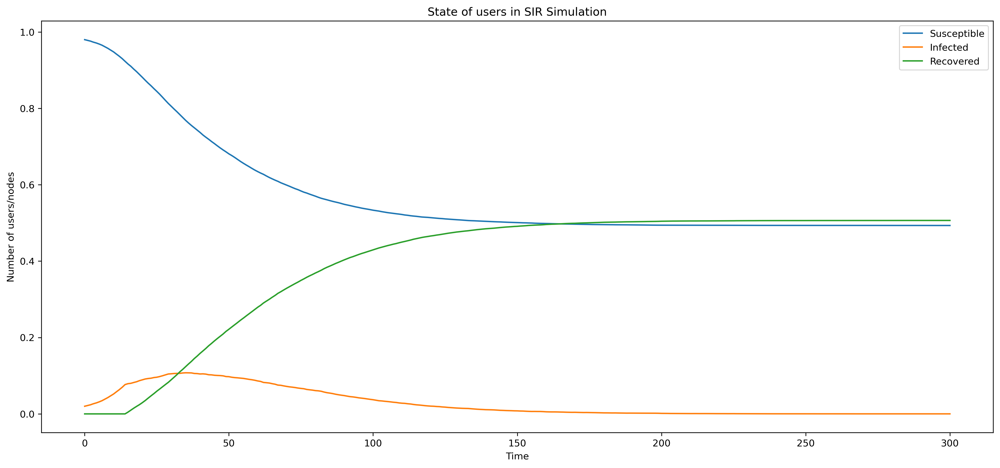

In [21]:
%%time
# Executing SIR model with different number of samples.
samples =300

final_S = [] # list to store the susceptible nodes under different samples.
final_I = [] # list to store the infected nodes under different samples.
final_R = [] # list to store the recovered nodes under different samples.

# Running simulation for different number of samples.
for s in range(samples):
    ini = random.sample(list(Gx.nodes()),3) # Setting 3 random initial nodes as infected
    mo2 = SIR_model(G=Gx,initial_infecteds=ini,beta=0.005,t_simulation=300,recovery_time=15) # calling SIR model function
    x = list(mo2.keys())
    N = len(Gx.nodes())
                    
    s_num = [len(mo2[i]["S"])/N for i in x] # extracting number of susceptible nodes on each day
    i_num = [len(mo2[i]["I"])/N for i in x] # extracting number infected nodes on each day
    r_num = [len(mo2[i]["R"])/N for i in x] # extracting number recovered nodes on each day
    
    # Adding to final lists
    final_S.append(s_num)
    final_I.append(i_num)
    final_R.append(r_num)

# Calculating mean of samples
mean_S_SIR = np.mean(np.array(final_S),axis=0)
mean_I_SIR = np.mean(np.array(final_I),axis=0)
mean_R_SIR = np.mean(np.array(final_R),axis=0)

# Plotting the outputs from SIR model
plt.plot(x,mean_S_SIR,label="Susceptible")
plt.plot(x,mean_I_SIR,label="Infected")
plt.plot(x,mean_R_SIR,label="Recovered")   
plt.title("State of users in SIR Simulation")
plt.xlabel("Time")
plt.ylabel("Number of users/nodes")
plt.legend()

### (3.c) Second Wave.
### After 100 days a second wave of the same infection start to spread on your network. Starting from day
### 100: 30 people get infected randomly in your network. Keep fixed the simulation propose by the SIR Model in
### question 3.b. At day 100, randomly add 30 new infections. If a person is infected by the second wave this set
### of rules applied:
### • if the person was ’S’ it became infected.
### • if the person was ’I’ you need to set to zero the recovery time (it will have to wait 15 days to became immune).
### • ’R’ remain recovered and it is immune to the second wave.
### This new infection transmits more easily and it has a beta=0.02!

In [22]:
def SIR_model_second_wave(G,initial_infecteds,beta,t_simulation,recovery_time):
    '''
    Performs a simulation of SIR model with a second wave of infection and returns the status of each node of a 
    network at end of simulation. At end of simulation nodes are in Susceptible, Infected and Recovered states
    
    Parameters
    ----------------
    G: networkx.classes.graph.Graph
       networkx object of used network.
    
    initial_infecteds: list
       Nodes with initial infection at time 0
       
            
    beta: float
       Infection rate
       
    t_simulation:int
        Number of days/time 
    
    recovery_time:int
        Number of days/time taken by a node to recover
    
    Returns
    -----------------
    status:  python dictionary
    Status of each node at end of simulation
    
    '''
                    
    nodes = G.nodes() # Fetching nodes of the network
    N = len(nodes) # Number of nodes in the network
    
    gamma = 1/recovery_time # calculating recovery rate
    
    infected = initial_infecteds # infected nodes 
    suscep = [n for n in nodes if n not in infected]  # Nodes in the susceptible state after introdcution of infection
    recovered = [] # No node is recovered intially
    new_variant_inf = [] # No node infected with new variant intially
    
    status = {} # Initialising dictionary to store status of each node at end of simulation
    
    
    inf_add = copy.deepcopy(infected) # Creating deepcopy object of infected nodes to store in status dictionary
    sus_add = copy.deepcopy(suscep) # Creating deepcopy object of susceptible nodes to store in status dictionary
    rec_add = copy.deepcopy(recovered) # Creating deepcopy object of recovered nodes to store in status dictionary
    new_variant_inf_add = copy.deepcopy(new_variant_inf) # Creating deepcopy object of new variant infected nodes to store in status dictionary
    
    status[0] = {"S":sus_add,"I":inf_add, "R":rec_add} # Storing status for day 0 when infection is introduced
    new_variant_beta = None
    
    for t in range(1,t_simulation+1):
        got_infected = [] #  Nodes getting infected on a day of simulation
        got_recovered = [] #  Nodes getting recovered on a day of simulation
        got_new_variant_inf = [] #  Nodes getting infected with new variant on a day of simulation
        
        # If it is 100th day or more, new variant enters the population
        if t >=100:
            new_variant_beta = 0.02
            
            # On 100th day, 30 random people catches new variant virus
            if t == 100:
                init_new_inf = random.sample(infected+suscep,30) # initial population with new variant infection
                new_variant_inf.extend(init_new_inf) # initially infected population extended to global list of new infections
                
                for i in new_variant_inf: # Iterating in  initial infected nodes
                    if i in infected:  # if new variant infected in from initials was already infected
                        infected.remove(i) # Remove from infected as node is infected from new variant and recovery resets
                    elif i in suscep:
                        suscep.remove(i) # Remove from susceptible as node is infected now.
            
            # New variant infection starts spreading with a faster rate
            
            for n in new_variant_inf:
                if t >= 115:
                    rec_prob = random.random() # Generating a random recovery probability
                    if rec_prob <= gamma: # checking if probability is under the recovery rate
                        got_recovered.append(n) # Recovered from new variant
                        new_variant_inf.remove(n) # Recovered nodes removed from new variant infection list
                        continue # exit this loop as we don't want to check neighbors of a recovered node from new variant
                
                for neighbor in G.neighbors(n): # iterating through neighbors of nodes with new variant infection
                    p = random.random()
                    
                    if  p <= new_variant_beta: # new infection infects wth faster rate
                        if neighbor not in new_variant_inf and neighbor not in got_new_variant_inf and neighbor not in recovered and neighbor not in got_recovered:    
                            got_new_variant_inf.append(neighbor)
                            if neighbor in suscep:
                                suscep.remove(neighbor) # That susceptible node is infected now
                            elif neighbor in infected:
                                infected.remove(neighbor)# That infected node is new variant infected now nad recovery resets
            
            # Extending new varinat infections from the day to list of overall new infections               
            new_variant_inf.extend(got_new_variant_inf) 

                        
        # Old variant still keeps infecting                
        for node in infected: # Iterating over infected nodes
            if t >= 15:
                rec_prob = random.random() # generating a random probability of node recovery
                if rec_prob <= gamma: # checking probability with recovery rate
                    got_recovered.append(node) # If probability under recovery rate, then node gets recovered
                    infected.remove(node) # Recovered node is removed from infected list
                    continue # exit this loop as we don't want to check neighbors of a recovered node
                
            for neighbor in G.neighbors(node): # checking neighbors of infected nodes
                p = random.random() # generating a random probability of node mixing
                if  p <= beta: # comparing with old infection rate
                    if neighbor not in infected and neighbor not in got_infected and neighbor not in recovered and neighbor not in got_recovered:
                        got_infected.append(neighbor) # If probability under transimission rate, then node gets infected
                        if neighbor in suscep:
                            suscep.remove(neighbor) # infected node removed form susceptibles
                        elif neighbor in infected:
                            infected.remove(neighbor)
        
        infected.extend(got_infected) # Extending infected nodes on a day to the overall infected list
        recovered.extend(got_recovered) # Extending recovered nodes on a day to the overall recovered list
        
        inf_add = copy.deepcopy(infected) # Creating deepcopy object of infected nodes to store in status dictionary
        rec_add = copy.deepcopy(recovered) # Creating deepcopy object of recovered nodes to store in status dictionary
        sus_add = copy.deepcopy(suscep) # Creating deepcopy object of susceptible nodes to store in status dictionary
        new_variant_inf_add = copy.deepcopy(new_variant_inf) # Creating deepcopy object of new variant infected nodes to store in status dictionary
        
        final_infections = inf_add + new_variant_inf_add # adding old variant + new variant infections
        
        status[t] = {"S":sus_add,"I":final_infections,"R":rec_add} # Adding node status at end of the day
    
    return status

Wall time: 13.9 s


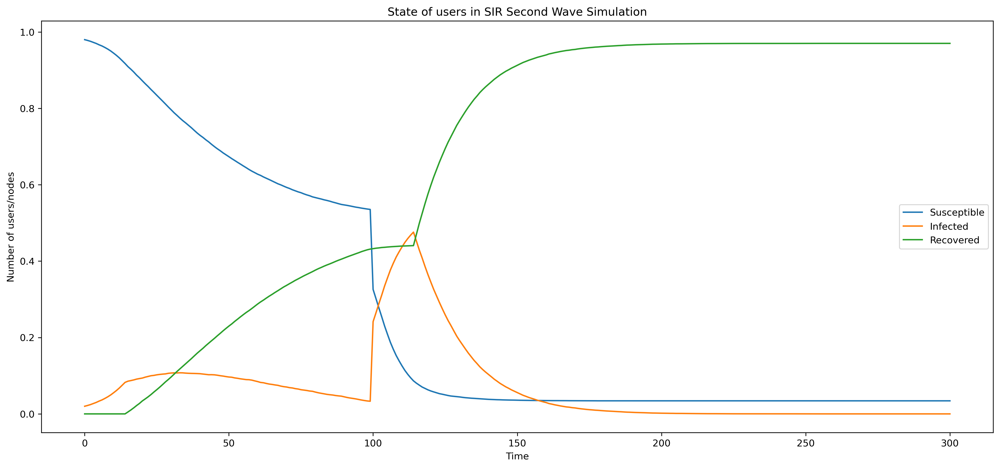

In [23]:
%%time
# Executing SIR_SecondWave model with different number of samples.
samples =300

final_S = [] # list to store the susceptible nodes under different samples.
final_I = [] # list to store the infected nodes under different samples.
final_R = [] # list to store the recovered nodes under different samples.

# Running simulation for different number of samples.
for s in range(samples):
    ini = random.sample(list(Gx.nodes()),3) # Setting 3 random initial nodes as infected
    mo3 = SIR_model_second_wave(G=Gx,initial_infecteds=ini,beta=0.005,t_simulation=300,recovery_time=15) # calling SIR model function
    x = list(mo3.keys())
    N = len(Gx.nodes())
                    
    s_num = [len(mo3[i]["S"])/N for i in x] # extracting number of susceptible nodes on each day
    i_num = [len(mo3[i]["I"])/N for i in x] # extracting number infected nodes on each day
    r_num = [len(mo3[i]["R"])/N for i in x] # extracting number recovered nodes on each day
    
    # Adding to final lists
    final_S.append(s_num)
    final_I.append(i_num)
    final_R.append(r_num)

# Calculating mean of samples
mean_S_sw = np.mean(np.array(final_S),axis=0)
mean_I_sw = np.mean(np.array(final_I),axis=0)
mean_R_sw = np.mean(np.array(final_R),axis=0)

# Plotting the outputs from SIR model
plt.plot(x,mean_S_sw,label="Susceptible")
plt.plot(x,mean_I_sw,label="Infected")
plt.plot(x,mean_R_sw,label="Recovered")   
plt.title("State of users in SIR Second Wave Simulation")
plt.xlabel("Time")
plt.ylabel("Number of users/nodes")
plt.title
plt.legend()

### (3.d) Remarks.
### Plot all the simulations together and make your final remarks on the simulation result of SI, SIR and Second
### Wave. How does the second wave affect your population? Please discuss this in your writing.

Parameters
******************************
Infection Rate (Beta): 0.005
Recovery Rate (Gamma): 0.06666666666666667
Simulation Time : 300
Second wave infection Rate (Beta New): 0.02


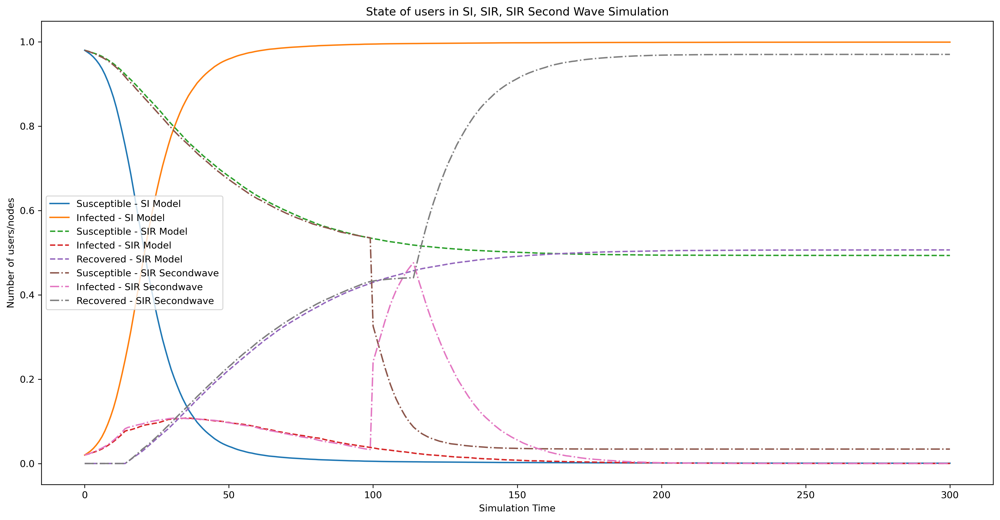

In [24]:
# Plotting SI, SIR and SecondWave together
rcParams['figure.figsize'] = 18, 9
plt.plot(x,mean_S_SI,label="Susceptible - SI Model")
plt.plot(x,mean_I_SI,label="Infected - SI Model")

plt.plot(x,mean_S_SIR,label="Susceptible - SIR Model",linestyle='dashed')
plt.plot(x,mean_I_SIR,label="Infected - SIR Model",linestyle='dashed')
plt.plot(x,mean_R_SIR,label="Recovered - SIR Model",linestyle='dashed') 

plt.plot(x,mean_S_sw,label="Susceptible - SIR Secondwave",linestyle='dashdot')
plt.plot(x,mean_I_sw,label="Infected - SIR Secondwave",linestyle='dashdot')
plt.plot(x,mean_R_sw,label="Recovered - SIR Secondwave",linestyle='dashdot')  

plt.title("State of users in SI, SIR, SIR Second Wave Simulation")
plt.xlabel("Simulation Time")
plt.ylabel("Number of users/nodes")
plt.title
plt.legend()

print("Parameters")
print("***"*10)
print("Infection Rate (Beta): "+str(0.005))
print("Recovery Rate (Gamma): "+str(1/15))
print("Simulation Time : "+str(300))
print("Second wave infection Rate (Beta New): "+str(0.02))

<H6 style="text-align: left">1. SI Model: </H6> The SI model divides whole population in two compartments- Susceptible and Infected. We ran a simulation for 300 time units with 3 nodes declared infected initially which starts spreading infection at a transmission rate (beta) of 0.01
It can be seen in the plot, as the infection starts spreading, the number of infected nodes/users starts rising exponentially and, count of population in susceptible state starts falling with same rate. At one point of time, all the users in susceptible state catches the infection and whole population becomes infected.This rate of people catching infection is driven by beta or infection rate.

<H6 style="text-align: left">2. SIR Model: </H6> SIR model divides whole population in three compartments - Susceptible,  Infected and Recovered. We ran a simulation for 300 time units with 3 nodes declared infected initially which starts spreading infection at a transmission rate (beta) of 0.005 and recovery of 15 days.
As the infection starts spreading, transition of users/nodes happens from susceptible to infected state and curve for users in infected state starts rising exponentially and curve for users in susceptible state starts declining as their number is decreasing. As the recovery starts happening after 15 days, the recovery curve starts rising from 15th day with a recovery rate given by gamma=1/15 (1/recovery days) = 0.066. We can observe that as the recovery starts, the exponential regime of infection starts getting flattened and as the infection rate of 0.005 is very low as compared to recovery rate of 0.66, the infection curve starts moving down slowly and ultimately the infection dies off.As, the recovery rate is higher than transmission rate, people recover fast and the infection dies out soon, and some users don't even catch the infection.

<H6 style="text-align: left">3. SIR Model Second Wave: </H6> This regime continues in the same way as SIR model, and we can see that upto 100th day, infection starts fading out and recovery is high. But, on 100th day of simulation, a new variant of infection is introduced in population having a higher infection rate beta of 0.02. It can be see in the plot that, on day 100, there is again an exponential rise in the number of infected nodes/users causing population to transit to infected from susceptible at a higher rate and a sharp decline in susceptible curve is seen. As the recovery period is 15 days, at day 115 we can see users infecetd with new variant starts showing recovery with a rate of 0.66 which is again higher than the new variant infection rate and infection curve starts declining. By end of the simulation, the whole population is recovered.
With second wave of infection, there was a sudden spike observed in infected people as the new variant is more infectious, slowing down the overall recovery process. We can relate this to recent real life example of COVID 19, where a new variant in UK caused a spike in the number of infected people and slowed down the recovery process.


_Note_ - Number of users on y axis were normalised between 0 to 1 for better understanding of scale of people getting infecetd,susceptible and recovered. Also, each simulation was executed 300 times or sampling was done  300 time to avoid any biases from randomness of probabilities used in the simulation and get better smoother curves.
